In [42]:
# small pertubations
import numpy as np

def perturb(df, col_list, mean, std_fix = 0, std_spec = 0, seed=None):
    df = df.copy()
    if seed is not None:
        np.random.seed(seed)
    for col in col_list:
        if std_spec:
            df[col] = df[col] + np.random.normal(mean, np.std(df[col])*std_spec, len(df))
        else:
            df[col] = df[col] + np.random.normal(mean, std_fix, len(df))
    return df

In [2]:
import pandas as pd
from model_function import Load_Model
X_train_df = pd.DataFrame(Load_Model("X_train"), columns = Load_Model("features"))
X_test_df = pd.DataFrame(Load_Model("X_test"), columns = Load_Model("features"))
X_test = Load_Model("X_test")
y_test = Load_Model("y_test")
X_train = Load_Model("X_train")
y_train = Load_Model("y_train")
features = Load_Model("features")
model = Load_Model('xgb_model')

In [43]:
features

['wind_speed',
 'track_distance',
 'total_houses',
 'rainfall_max_6h',
 'rainfall_max_24h',
 'rwi',
 'mean_slope',
 'std_slope',
 'mean_tri',
 'std_tri',
 'mean_elev',
 'coast_length',
 'with_coast',
 'urban',
 'rural',
 'water',
 'total_pop',
 'percent_houses_damaged_5years']

In [4]:
from pert_metrics import perturb

In [5]:
# full perturbed dataset with small variance
import numpy as np

X_train_p = np.array(perturb(X_train_df,features, 0, 0.1, seed=0))
X_test_p = np.array(perturb(X_test_df,features, 0, 0.1, seed=0))

In [6]:
# generate & compare predictions of X_test and X_test_p
y_pred_p = model.predict(X_test_p)
y_pred = model.predict(X_test)
d = np.abs(y_pred_p - y_pred)
pd.DataFrame([y_pred, y_pred_p, y_pred_p - y_pred])

,0,1,2,3,4,5,6,7,8,9,...,9941,9942,9943,9944,9945,9946,9947,9948,9949,9950
0,-0.030171,0.529008,0.133954,0.049151,0.073128,0.490155,0.818342,1.774486,2.781075,0.108477,...,1.151294,0.008362,0.626028,-0.045396,0.004284,0.082351,-0.034028,0.663063,3.629068,0.039501
1,-0.045396,0.529008,0.123550,0.023866,-0.023401,0.425727,0.263463,1.786990,2.781075,0.122868,...,0.785784,0.051879,0.712385,-0.045396,0.004284,0.097524,-0.020744,0.839295,4.062469,0.050778
2,-0.015225,0.000000,-0.010404,-0.025286,-0.096529,-0.064429,-0.554879,0.012504,0.000000,0.014391,...,-0.365510,0.043517,0.086357,0.000000,0.000000,0.015174,0.013284,0.176232,0.433401,0.011277


In [7]:
# calculate indices where d < 0.1*y_pred
th = 0.01

idx_similar = np.where(d < th*y_pred)[0]
print(idx_similar[:10])
idx_similar.shape

[ 1  7  8 12 16 19 20 29 32 39]


(1157,)

In [8]:
# reduce X_test_p and X_test to similar predictions
X_test_p_similar = X_test_p[idx_similar]
X_test_similar = X_test[idx_similar]

In [9]:
# LIME  

from lime.lime_tabular import LimeTabularExplainer

# Global lime values

def LIME_global(X_train, X_test, features, model):
    explainer = LimeTabularExplainer(training_data=X_train, feature_names=features, class_names=y_train, verbose=True, mode='regression', discretize_continuous=False)
    lime_dict = {}
    for f in features:
        lime_dict[f] = []
    for i in range(len(X_test)):
        instance = X_test[i]
        explanation = explainer.explain_instance(instance, model.predict, num_features=len(features))
        explist = dict(explanation.as_list())
        for feature in explist.keys():
            # if feature not in lime_dict:
            #     lime_dict[feature] = []
            lime_dict[feature].append(explist[feature])
    lime_df = pd.DataFrame(lime_dict)
    return lime_df


In [10]:
lime_exp = LIME_global(X_train, X_test_similar, features, model)
lime_exp_p = LIME_global(X_train, X_test_p_similar, features, model)

Intercept 0.41263422142160006
Prediction_local [2.04508318]
Right: 0.5290078
Intercept 0.39561277413175805
Prediction_local [1.91309315]
Right: 1.774486
Intercept 0.3864612164514604
Prediction_local [1.71548266]
Right: 2.781075
Intercept 0.38458384832828285
Prediction_local [0.49432688]
Right: 0.039501354
Intercept 0.41687201657658113
Prediction_local [0.2425213]
Right: 0.011559345
Intercept 0.4364619438084742
Prediction_local [0.19213123]
Right: 0.02409303
Intercept 0.41843301490113954
Prediction_local [-0.18193646]
Right: 0.011559345
Intercept 0.4252091331130277
Prediction_local [-0.30829864]
Right: 0.0035854154
Intercept 0.390356027123506
Prediction_local [2.69297505]
Right: 5.3909163
Intercept 0.4300478191456898
Prediction_local [0.07469777]
Right: 0.045236595
Intercept 0.39673173441451215
Prediction_local [0.03690081]
Right: 0.05791053
Intercept 0.465377801386836
Prediction_local [0.51433089]
Right: 0.029055415
Intercept 0.42588068587777067
Prediction_local [0.23297069]
Right: 0.1

In [11]:
lime_exp2 = LIME_global(X_test, X_test_similar, features, model)
lime_exp_p2 = LIME_global(X_test, X_test_p_similar, features, model)

Intercept 0.4152561102191304
Prediction_local [1.93651674]
Right: 0.5290078
Intercept 0.40048409912192173
Prediction_local [1.83919308]
Right: 1.774486
Intercept 0.41947270151066357
Prediction_local [2.04048871]
Right: 2.781075
Intercept 0.452456422638488
Prediction_local [0.42446469]
Right: 0.039501354
Intercept 0.4597498554116598
Prediction_local [0.24782293]
Right: 0.011559345
Intercept 0.41140168334458427
Prediction_local [-0.01037261]
Right: 0.02409303
Intercept 0.42834099311295915
Prediction_local [-0.32962822]
Right: 0.011559345
Intercept 0.41054857203224426
Prediction_local [-0.34263782]
Right: 0.0035854154
Intercept 0.4063502713012317
Prediction_local [3.06381929]
Right: 5.3909163
Intercept 0.49085701171620344
Prediction_local [-0.00385665]
Right: 0.045236595
Intercept 0.46079461606660643
Prediction_local [0.0894248]
Right: 0.05791053
Intercept 0.4283495729302661
Prediction_local [0.58152017]
Right: 0.029055415
Intercept 0.41416531241881316
Prediction_local [0.45432663]
Right:

In [12]:
# Calculate the difference
diff_perc = (lime_exp - lime_exp_p)/lime_exp

# Calculate the p-norm
p = 2  
numerator = np.linalg.norm(diff_perc, ord=p)

# Calculate the denominator	
diff_perc2 = (X_test_similar - X_test_p_similar)/X_test_similar

epsilon_min = 0.1
denominator = max(np.linalg.norm(diff_perc2, ord=p), epsilon_min)

# Calculate the final metric
numerator/denominator


0.8984214801706516

In [13]:
lime_exp.head(3)

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
0,0.686429,-0.267441,-0.044373,0.139060,0.016997,-0.189479,-0.038138,-0.002150,0.006063,-0.026236,0.015887,0.052026,0.043892,-0.060676,0.034120,0.015499,-0.008574,0.065315
1,0.632953,-0.217951,0.002431,0.117249,0.043826,-0.121136,-0.012816,-0.000406,-0.015553,-0.037148,-0.027341,0.038731,-0.018769,0.002191,-0.007138,0.024960,-0.050770,0.071965
2,0.591810,-0.222024,-0.015531,0.089311,0.041079,-0.130302,-0.028105,-0.002833,-0.005235,-0.019025,-0.012571,0.048891,0.023329,-0.030825,0.018392,-0.001918,-0.049118,0.067436


In [14]:
lime_exp_p.head(3)

,wind_speed,track_distance,total_houses,rainfall_max_6h,rainfall_max_24h,rwi,mean_slope,std_slope,mean_tri,std_tri,mean_elev,coast_length,with_coast,urban,rural,water,total_pop,percent_houses_damaged_5years
0,0.716938,-0.241102,0.008163,0.128520,0.046865,-0.154545,0.021142,-0.073608,-0.046020,0.009561,-0.063260,0.027949,0.023604,-0.026639,-0.008300,-0.031683,-0.031926,0.123264
1,0.648315,-0.200469,0.010540,0.042646,0.060268,-0.092005,-0.047976,-0.001746,0.020178,-0.000281,-0.024279,0.032596,-0.011756,-0.042434,0.007883,0.008645,-0.074128,0.093562
2,0.684112,-0.290906,-0.030681,0.085047,0.071619,-0.165175,-0.005335,-0.014085,0.009734,-0.020851,-0.058459,0.035635,0.000470,-0.028798,0.026704,-0.009393,-0.018843,0.075265


In [15]:
max_ratio = 0
p = 2  
ratiolist = []

def RIS(X_sim, X_prime, exp, exp_prime, p, epsilon_min):
    X_sim = np.array(X_sim)
    X_prime = np.array(X_prime)
    exp = np.array(exp)
    exp_prime = np.array(exp_prime)
    
    ratiolist = []
    max_ratio = 0
    if len(X_sim) != len(X_prime) or len(exp) != len(exp_prime) or len(X_sim) != len(exp):
        raise ValueError("The length of the input data and the explanation data should be the same.")
    
    for i in range(len(X_prime)):
        
        diff_ex = np.linalg.norm(exp[i] - exp_prime[i], p)
        numerator = diff_ex / np.linalg.norm(exp[i], p) #np.linalg.norm(diff_ex, ord=p)

        # diff_ex =(exp[i] - exp_prime[i])/exp[i]
        # print(exp[i], exp_prime[i], diff_ex)
        # numerator = np.linalg.norm(diff_ex, p)

        diff_input = np.linalg.norm(X_sim[i] - X_prime[i]) #/X_sim[i]
        denominator = max(diff_input / np.linalg.norm(X_sim[i], ord=p), epsilon_min)

        # diff_input = (X_sim[i] - X_prime[i])/X_sim[i]
        # denominator = max(np.linalg.norm(diff_input, ord=p), epsilon_min)

        ratio = numerator / denominator
        ratiolist.append(ratio)
        max_ratio = max(max_ratio, ratio)

    return ratiolist, np.mean(ratiolist)


# for i in range(len(lime_exp)):
#     diff_ex = (np.array(lime_exp)[i] - np.array(lime_exp_p)[i]) / np.array(lime_exp)[i]
#     numerator = np.linalg.norm(diff_ex, ord=p)

#     diff_input = (X_test_similar[i] - X_test_p_similar[i])/X_test_similar[i]
#     denominator = max(np.linalg.norm(diff_input, ord=p), epsilon_min)
#     ratio = numerator / denominator
#     ratiolist.append(ratio)
#     max_ratio = max(max_ratio, ratio)
# print(max_ratio)
# print(ratiolist)

# m, RIS_list = RIS(X_test_similar, X_test_p_similar, lime_exp, lime_exp_p, p, epsilon_min)
# np.mean(RIS_list)
# RIS_list[:10]

In [25]:
def RIS_scaled(X_sim, X_prime, exp, exp_prime, p, epsilon_min):
    X_sim = np.array(X_sim)
    X_prime = np.array(X_prime)
    exp = np.array(exp)
    exp_prime = np.array(exp_prime)
    
    ratiolist = []
    max_ratio = 0
    if len(X_sim) != len(X_prime) or len(exp) != len(exp_prime) or len(X_sim) != len(exp):
        raise ValueError("The length of the input data and the explanation data should be the same.")
    
    for i in range(len(X_prime)):
        X_sim_scaled = (X_sim[i] - np.min(X_sim[i])) / (np.max(X_sim[i]) - np.min(X_sim[i]))
        X_prime_scaled = (X_prime[i] - np.min(X_prime[i])) / (np.max(X_prime[i]) - np.min(X_prime[i]))

        diff_ex = np.linalg.norm(exp[i] - exp_prime[i], p)
        numerator = diff_ex / np.linalg.norm(exp[i], p) #np.linalg.norm(diff_ex, ord=p)

        # diff_ex =(exp[i] - exp_prime[i])/exp[i]
        # print(exp[i], exp_prime[i], diff_ex)
        # numerator = np.linalg.norm(diff_ex, p)

        diff_input = np.linalg.norm(X_sim_scaled - X_prime_scaled) #/X_sim[i]
        denominator = max(diff_input / np.linalg.norm(X_sim_scaled, ord=p), epsilon_min)

        ratio = numerator / denominator
        ratiolist.append(ratio)
        max_ratio = max(max_ratio, ratio)

    return ratiolist, np.mean(ratiolist)


In [16]:
# m, RIS_list = RIS(X_test_similar[:1], X_test_p_similar[:1], lime_exp[:1], lime_exp_p[:1], p, epsilon_min)
# len(RIS_list)

np.mean(RIS(X_test_similar[:10], X_test_p_similar[:10], lime_exp[:10], lime_exp_p[:10], p, epsilon_min)[1])

2.1587885891139806

In [17]:
np.mean(RIS(X_test_similar, X_test_p_similar, lime_exp, lime_exp_p, p, epsilon_min)[1])
#1.780425816708936
#2.054667429229814 with lower permutation variance
#1.8120652635003296 with lower permutation variance and 0.01 threshold

1.8120652635003296

In [18]:
np.mean(RIS(X_test_similar, X_test_p_similar, lime_exp2, lime_exp_p2, p, epsilon_min)[1])


1.745750586452639

In [19]:
# import numpy as np

# def p_norm(vector, p):
#     """Compute the p-norm of a vector."""
#     return np.linalg.norm(vector, ord=p)

# def RIS(x, x_prime_list, e_x, e_x_prime_list, p, epsilon_min):
#     """Compute the Relative Importance Score (RIS) as defined in the formula."""
#     max_ratio = 0
#     for x_prime, e_x_prime in zip(x_prime_list, e_x_prime_list):
#         numerator = p_norm((e_x - e_x_prime) / e_x, p)
#         denominator = max(p_norm(x - x_prime, p), epsilon_min)
#         ratio = numerator / denominator
#         max_ratio = max(max_ratio, ratio)
#     return max_ratio

# # Example usage:
# x = np.array([1.0, 2.0])  # Example vector x
# x_prime_list = [np.array([1.1, 2.1]), np.array([0.9, 1.9])]  # Neighborhood vectors of x
# e_x = np.array([0.1, 0.2])  # Error vector for x
# e_x_prime_list = [np.array([0.1, 0.2]), np.array([0.1, 0.2])]  # Error vectors for x'
# p = 2  # Using Euclidean norm
# epsilon_min = 0.01  # Small constant to prevent division by zero

# ris_value = RIS(x, x_prime_list, e_x, e_x_prime_list, p, epsilon_min)
# print("The RIS value is:", ris_value)

## SHAP

In [20]:
import shap
X_train4shapely = pd.DataFrame(data=X_train, columns=features)
explainer = shap.Explainer(model, X_train4shapely)

shap_values_1 = explainer.shap_values(X_test_similar)
shap_values_2 = explainer.shap_values(X_test_p_similar)

In [21]:
np.mean(RIS(X_test_similar, X_test_p_similar, shap_values_1, shap_values_2, p, epsilon_min)[1])
#0.7997773979944711
#0.5726531093601542 with lower permutation variance (0.05)
#0.5541208512726823 with lower permutation variance (0.05) and 0.01 threshold

0.5541208512726823

In [22]:
# idea: graph of RIS values SHAP vs Lime for row of permutation variance & threshold
# -> argue that SHAP is more stable

# Functions

In [23]:
def similar_perturbations(X, features, model, perturbation, sim_th, seed=None):

    X_df = pd.DataFrame(X, columns = features)
    # X_test_df = pd.DataFrame(X_test, columns = features)

    X_p = np.array(perturb(X_df,features, 0, perturbation , seed=seed))
    #X_test_p = np.array(perturb(X_test_df,features, 0, 0.1, seed=0))

    y_pred_p = model.predict(X)
    y_pred = model.predict(X_p)

    d = np.abs(y_pred_p - y_pred)
    # pd.DataFrame([y_pred, y_pred_p, y_pred_p - y_pred])

    idx_similar = np.where(d < sim_th*y_pred)[0]
    #print(idx_similar[:10])
    #idx_similar.shape

    X_p_similar = X_test_p[idx_similar]
    X_similar = X_test[idx_similar]

    return X_similar, X_p_similar

In [26]:
X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.1, sim_th=0.01, seed=0)

lime_exp = LIME_global(X_train, X_sim, features, model)
lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
_, R = RIS(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
print("LIME RIS: ", R)

Intercept 0.41263422142160006
Prediction_local [2.04508318]
Right: 0.5290078
Intercept 0.39561277413175805
Prediction_local [1.91309315]
Right: 1.774486
Intercept 0.3864612164514604
Prediction_local [1.71548266]
Right: 2.781075
Intercept 0.38458384832828285
Prediction_local [0.49432688]
Right: 0.039501354
Intercept 0.41687201657658113
Prediction_local [0.2425213]
Right: 0.011559345
Intercept 0.4364619438084742
Prediction_local [0.19213123]
Right: 0.02409303
Intercept 0.41843301490113954
Prediction_local [-0.18193646]
Right: 0.011559345
Intercept 0.4252091331130277
Prediction_local [-0.30829864]
Right: 0.0035854154
Intercept 0.390356027123506
Prediction_local [2.69297505]
Right: 5.3909163
Intercept 0.4300478191456898
Prediction_local [0.07469777]
Right: 0.045236595
Intercept 0.39673173441451215
Prediction_local [0.03690081]
Right: 0.05791053
Intercept 0.465377801386836
Prediction_local [0.51433089]
Right: 0.029055415
Intercept 0.42588068587777067
Prediction_local [0.23297069]
Right: 0.1

In [37]:
_, R2 = RIS_scaled(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
print(R2)

2.039525821227935


In [27]:
X_train4shapely = pd.DataFrame(data=X_train, columns=features)
explainer = shap.Explainer(model, X_train4shapely)

shap_values_1 = explainer.shap_values(X_sim)
shap_values_2 = explainer.shap_values(X_sim_p)
_, R = RIS(X_sim, X_sim_p, shap_values_1, shap_values_2, 2, epsilon_min=0.1)
print(R)


0.5549139419967559


In [28]:
lime_RIS = []
for p in [i/100 for i in range(1, 21,2)]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = p, sim_th=0.01, seed=0)

    lime_exp = LIME_global(X_train, X_sim, features, model)
    lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    _, R = RIS(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
    lime_RIS.append(R)

Intercept 0.41263422142160006
Prediction_local [2.04508318]
Right: 0.5290078
Intercept 0.40774713287327313
Prediction_local [0.3671169]
Right: 0.13395418
Intercept 0.3976986575083108
Prediction_local [0.42867793]
Right: 0.04915137
Intercept 0.36788046115806655
Prediction_local [1.88373628]
Right: 1.774486
Intercept 0.4017268407670095
Prediction_local [1.967966]
Right: 2.781075
Intercept 0.43322482841565707
Prediction_local [0.94573281]
Right: 0.108476795
Intercept 0.4134722106999298
Prediction_local [1.91346136]
Right: 1.303105
Intercept 0.4304395123494532
Prediction_local [0.13904715]
Right: 0.013427935
Intercept 0.4296456602528725
Prediction_local [0.39644037]
Right: 0.039501354
Intercept 0.4271839221781184
Prediction_local [-0.06123023]
Right: 0.011559345
Intercept 0.3915501726514883
Prediction_local [1.17942082]
Right: 0.37691814
Intercept 0.46265779195186035
Prediction_local [0.19592295]
Right: 0.011559345
Intercept 0.4238715762497079
Prediction_local [0.44318379]
Right: 0.0115593

In [29]:
shap_RIS = []
for p in [i/100 for i in range(1, 21,2)]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = p, sim_th=0.01, seed=0)

    # lime_exp = LIME_global(X_train, X_sim, features, model)
    # lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    # _, R = RIS(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
    
    shap_values_1 = explainer.shap_values(X_sim)
    shap_values_2 = explainer.shap_values(X_sim_p)
    _, R = RIS(X_sim, X_sim_p, shap_values_1, shap_values_2, 2, epsilon_min=0.1)

    shap_RIS.append(R)

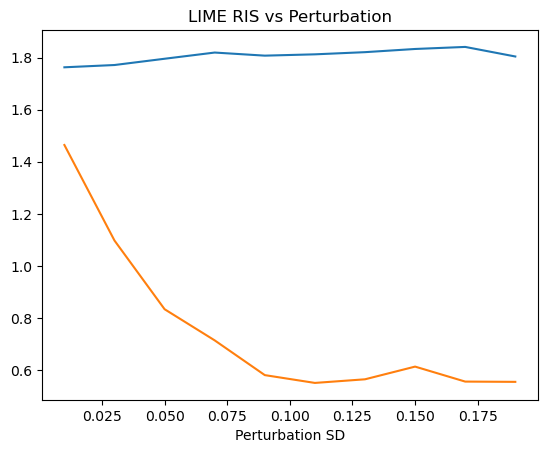

In [30]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in range(1, 21,2)], lime_RIS)
plt.title("LIME RIS vs Perturbation")
plt.xlabel("Perturbation SD")

plt.plot([i/100 for i in range(1, 21,2)], shap_RIS)

In [31]:
lime_RIS2 = []
for t in [i/100 for i in range(1, 21,2)]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.1, sim_th=t, seed=0)

    lime_exp = LIME_global(X_train, X_sim, features, model)
    lime_exp_p = LIME_global(X_train, X_sim_p, features, model)
    _, R = RIS(X_sim, X_sim_p, lime_exp, lime_exp_p, 2, epsilon_min = 0.1)
    lime_RIS2.append(R)

shap_RIS2 = []
for t in [i/100 for i in range(1, 21,2)]:
    X_sim, X_sim_p = similar_perturbations(X_test, features, model, perturbation = 0.1, sim_th=t, seed=0)
    
    shap_values_1 = explainer.shap_values(X_sim)
    shap_values_2 = explainer.shap_values(X_sim_p)
    _, R = RIS(X_sim, X_sim_p, shap_values_1, shap_values_2, 2, epsilon_min=0.1)
    shap_RIS2.append(R)

Intercept 0.41263422142160006
Prediction_local [2.04508318]
Right: 0.5290078
Intercept 0.39561277413175805
Prediction_local [1.91309315]
Right: 1.774486
Intercept 0.3864612164514604
Prediction_local [1.71548266]
Right: 2.781075
Intercept 0.38458384832828285
Prediction_local [0.49432688]
Right: 0.039501354
Intercept 0.41687201657658113
Prediction_local [0.2425213]
Right: 0.011559345
Intercept 0.4364619438084742
Prediction_local [0.19213123]
Right: 0.02409303
Intercept 0.41843301490113954
Prediction_local [-0.18193646]
Right: 0.011559345
Intercept 0.4252091331130277
Prediction_local [-0.30829864]
Right: 0.0035854154
Intercept 0.390356027123506
Prediction_local [2.69297505]
Right: 5.3909163
Intercept 0.4300478191456898
Prediction_local [0.07469777]
Right: 0.045236595
Intercept 0.39673173441451215
Prediction_local [0.03690081]
Right: 0.05791053
Intercept 0.465377801386836
Prediction_local [0.51433089]
Right: 0.029055415
Intercept 0.42588068587777067
Prediction_local [0.23297069]
Right: 0.1

In [32]:
lime_RIS2

[1.8258180125962846,
 1.8097321210952464,
 1.829830353442508,
 1.8154221065961356,
 1.816294478281858,
 1.8172115456873024,
 1.7901830173984998,
 1.8071958704610689,
 1.8117518193525919,
 1.8072481271741718]

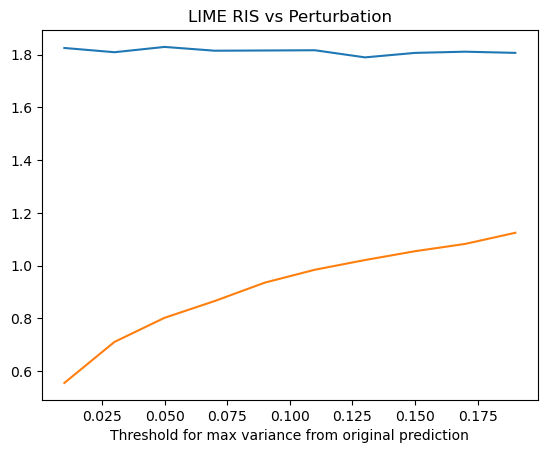

In [36]:
from matplotlib import pyplot as plt

plt.plot([i/100 for i in range(1, 21,2)], lime_RIS2)
plt.title("LIME RIS vs Perturbation")
plt.xlabel("Threshold for max variance from original prediction")

plt.plot([i/100 for i in range(1, 21,2)], shap_RIS2)

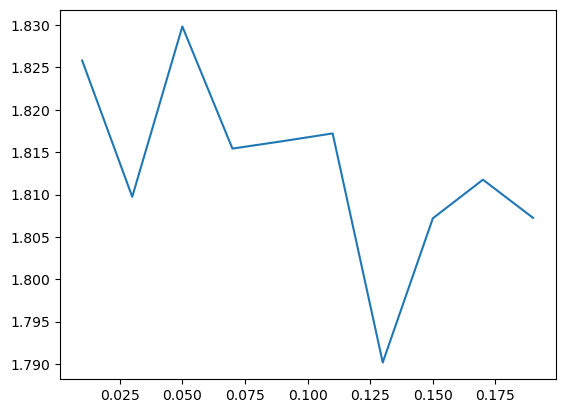

In [34]:
plt.plot([i/100 for i in range(1, 21,2)], lime_RIS2)

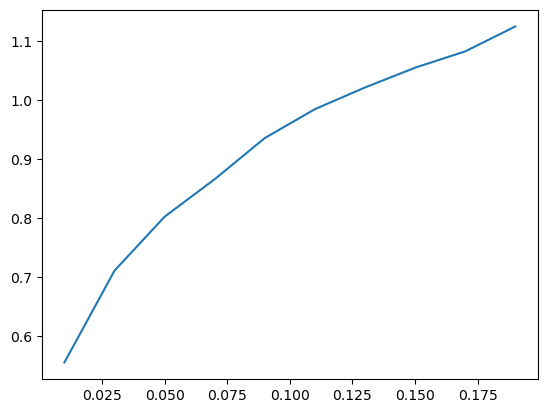

In [40]:
plt.plot([i/100 for i in range(1, 21,2)], shap_RIS2)